# IMPORT DEPENDENCIES

In [1]:
import pandas as pd
import numpy as np
import panel as pn
pn.extension('tabulator')
import hvplot.pandas
import base64

In [2]:
data = pd.read_csv('new_epi_r.csv')
data

,Unnamed: 0,rating,calories,protein,fat,sodium,prep_time
0,0,2.500,426.0,30.0,7.0,559.0,17
1,1,4.375,403.0,18.0,23.0,1439.0,18
2,2,3.750,165.0,6.0,7.0,165.0,9
3,3,5.000,165.0,6.0,7.0,165.0,10
4,4,3.125,547.0,20.0,32.0,452.0,32
...,...,...,...,...,...,...,...
16806,20046,3.750,998.0,55.0,80.0,2027.0,107
16807,20047,3.125,28.0,2.0,2.0,64.0,14
16808,20048,4.375,671.0,22.0,28.0,583.0,33
16809,20049,4.375,563.0,31.0,38.0,652.0,30


# PREPROCESSING UNIT

In [3]:
data.describe()

,Unnamed: 0,rating,calories,protein,fat,sodium,prep_time
count,16811.000000,16811.000000,16811.000000,16811.000000,16811.000000,16811.00000,16811.000000
mean,9770.856404,3.701483,377.954673,14.381120,20.721016,403.09815,28.695735
std,5800.761768,1.341409,250.520585,16.140164,18.305075,435.80444,22.430763
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,5.000000
25%,4709.500000,3.750000,194.000000,3.000000,7.000000,71.00000,15.000000
50%,9655.000000,4.375000,311.000000,7.000000,16.000000,247.00000,23.000000
75%,14780.500000,4.375000,515.000000,21.000000,29.000000,593.00000,32.000000
max,20050.000000,5.000000,1347.000000,75.000000,100.000000,2141.00000,120.000000


In [4]:
data.head()

,Unnamed: 0,rating,calories,protein,fat,sodium,prep_time
0,0,2.500,426.0,30.0,7.0,559.0,17
1,1,4.375,403.0,18.0,23.0,1439.0,18
2,2,3.750,165.0,6.0,7.0,165.0,9
3,3,5.000,165.0,6.0,7.0,165.0,10
4,4,3.125,547.0,20.0,32.0,452.0,32


In [5]:
data.tail()

,Unnamed: 0,rating,calories,protein,fat,sodium,prep_time
16806,20046,3.750,998.0,55.0,80.0,2027.0,107
16807,20047,3.125,28.0,2.0,2.0,64.0,14
16808,20048,4.375,671.0,22.0,28.0,583.0,33
16809,20049,4.375,563.0,31.0,38.0,652.0,30
16810,20050,4.375,631.0,45.0,24.0,517.0,44


In [6]:
data.isna().sum()

Unnamed: 0    0
rating        0
calories      0
protein       0
fat           0
sodium        0
prep_time     0
dtype: int64

# DASHBOARD CREATION UNIT

In [7]:
#making our dataframe interactive
i_data = data.interactive()

In [8]:
#created widget slider wiht the help of panel lib.
preptime_slider = pn.widgets.FloatSlider(name = 'Prep time',  start = 0, end = 120, step = 10, value = 60)
preptime_slider

FloatSlider(end=120, name='Prep time', step=10, value=60)

In [9]:
#Radio buttons
y_axis = pn.widgets.RadioButtonGroup(
    name = 'Y Axis',
    options = ['sodium', 'calories', 'protein'],
    button_type = 'success'
)
y_axis

RadioButtonGroup(button_type='success', name='Y Axis', options=['sodium', 'calories', ...], value='sodium')

In [10]:
#Now linking the wedget with our inteactive dataframe
prep_pipline = (
    i_data[
    (i_data.prep_time <= preptime_slider)
    ]
    .groupby(['fat', 'rating', 'prep_time'])[y_axis].mean()
    .to_frame()
    .reset_index()
    .sort_values(by = 'prep_time')
    .reset_index(drop = True)
)

In [11]:
prep_pipline

In [12]:
#preparing the prototype Linechart for the dashboard
line_chart = prep_pipline.hvplot(x = 'prep_time', y= y_axis, line_width = 2, title = 'Nutrients according to Preparation Time')

In [13]:
line_chart

In [14]:
table_chart = prep_pipline.pipe(pn.widgets.Tabulator, pagination = 'remote', page_size = 10, sizing_mode = 'stretch_width', name = 'Details of Nutrients')

In [15]:
table_chart

In [16]:
scatter_chart = prep_pipline.hvplot.scatter(x = 'prep_time', y = y_axis, title = 'Scatter Chart' )
scatter_chart

In [17]:
heatmap = prep_pipline.hvplot.heatmap(x = 'prep_time', y = y_axis, title = 'HeatMap')

In [18]:
heatmap

FastListTemplate
    [js_area] HTML(None, height=0, margin=0, sizing_mode='fixed', width=0)
    [actions] TemplateActions()
    [browser_info] BrowserInfo()
    [busy_indicator] LoadingSpinner(height=20, width=20)
    [2673994278288] Row
        [0] Column(margin=(0, 25))
            [0] RadioButtonGroup(button_type='success', name='Y Axis', options=['sodium', 'calories', ...], value='sodium')
            [1] ParamFunction(function, _pane=HoloViews, defer_load=False, width=550)
        [1] ParamFunction(function, _pane=Tabulator, defer_load=False, width=700)
    [2673994821648] Row
        [0] Column(margin=(0, 25))
            [0] ParamFunction(function, _pane=HoloViews, defer_load=False, width=450)
        [1] ParamFunction(function, _pane=HoloViews, defer_load=False, width=600)
    [2673917223760] Markdown(str, css_classes=['markdown-text'])
    [2673917492496] FloatSlider(end=120, name='Prep time', step=10, value=60)
    [2673980476368] Markdown(str, css_classes=['markdown-text'])
    [2674005611024] PNG(str, sizing_mode='scale_both')
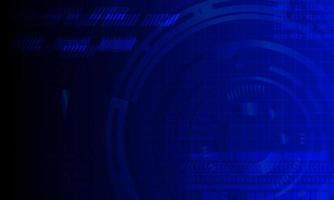
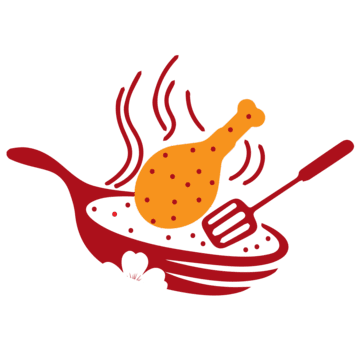

In [19]:
#Layout of the dashboard
with open("background.jpg", "rb") as image_file:
    encoded_image = base64.b64encode(image_file.read()).decode('utf-8')

custom_css = f"""
body {{
    background-image: url(data:image/jpeg;base64,{encoded_image});
    background-size: cover;
    background-repeat: no-repeat;
    background-position: center;
}}
.markdown-text {{
    color: white !important;
    font-size: 10px;  
}}
.bk-slider .bk-slider-title {{
    background: White !important;
}}
"""

template = pn.template.FastListTemplate(
    title = 'Change in Recipe Nutritional Content with Respect to Preparation Time',
    sidebar = [pn.pane.Markdown("# Preparation time can indirectly influence the nutrient content of food, as longer cooking times may lead to nutrient loss, particularly for vitamins and minerals. However, the core nutrients like calories, fat, and sodium.", css_classes = ['markdown-text']),
               preptime_slider,
               pn.pane.Markdown("## Setting", css_classes = ['markdown-text']),
               pn.pane.PNG('side_img.png', sizing_mode = 'scale_both')
              ],
    main = [pn.Row(pn.Column(y_axis, line_chart.panel(width = 550), margin = (0, 25)), (table_chart.panel(width = 700))),
            pn.Row(pn.Column(scatter_chart.panel(width = 450), margin = (0, 25)),(heatmap.panel(width = 600)))]
)
template.config.raw_css = [custom_css]
template.servable()